# Set-Up

In [33]:
### Import libraries

import pathlib                  # file paths
import os                       # file paths
import warnings                 # warnings

import pandas as pd             # dataframes
import geopandas as gpd         # geodataframes
import numpy as np              # arrays
import xarray as xr             # multi-dimensional arrays
import rioxarray as rxr         # rasters + xarray
import rioxarray.merge as rxrm  # raster merging
import shapely                  # geometric operations
import time                     # time operations

import geoviews as gv           # geospatial visualizations
import holoviews as hv          # interactive visualizations
import hvplot.pandas            # pandas visualizations
import hvplot.xarray            # xarray visualizations
from cartopy import crs as ccrs # coordinate reference systems

import matplotlib               # plotting
import matplotlib.pyplot as plt # plotting
import scipy.stats as stats     # statistical analysis

import pystac_client            # STAC catalog access
from sodapy import Socrata      # Socrata Open Data API
import requests                 # JSON Census API requests

from tqdm.notebook import tqdm      # progress bars
from scipy.ndimage import convolve  # image processing
from scipy.ndimage import label     # image processing
from bokeh.models import NumeralTickFormatter  # plot formatting

from sklearn.linear_model import LinearRegression           # linear regression model
from sklearn.model_selection import train_test_split        # train-test split
from sklearn.model_selection import KFold                   # k-fold cross-validation
from sklearn.metrics import mean_squared_error, r2_score    # model evaluation metrics

In [2]:
### Create reproducible file paths
dir = os.path.join(
    pathlib.Path.home(),

    'Data',
    'Earth Analytics',
    'greenspace-portfolio'

)

os.makedirs(dir, exist_ok=True)

In [3]:
### Prevent GDAL from quitting due to momentary disruptions
os.environ["GDAL_HTTP_MAX_RETRY"] = "5"
os.environ["GDAL_HTTP_RETRY_DELAY"] = "1"

In [4]:
### Set up the census tract path

tract_dir = os.path.join(dir, 'chicago-tract')
os.makedirs(tract_dir, exist_ok=True)
tract_path = os.path.join(tract_dir, 'chicago-tracts.shp')

### Download the census tracts (only once)
if not os.path.exists(tract_path):
    tract_url = ('https://data.cdc.gov/download/x7zy-2xmx/application%2Fzip')

    tract_gdf = gpd.read_file(tract_url)

    chi_tract_gdf = tract_gdf[tract_gdf.PlaceName == 'Chicago']

    chi_tract_gdf.to_file(tract_path, index = False)

### Load in census tract data

chi_tract_gdf = gpd.read_file(tract_path)
chi_tract_gdf

### Site plot -- Census tracts with satellite imagery in the background
(
    chi_tract_gdf

    .to_crs(ccrs.Mercator())

    .hvplot(
        line_color = 'blue', fill_color = None,
        crs = ccrs.Mercator(), tiles = 'EsriImagery',
        frame_width = 600,
        title = 'Chicago Census Tracts'
    )
)

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]

In [5]:
chi_tract_gdf

,place2010,tract2010,ST,PlaceName,plctract10,PlcTrPop10,geometry
0,1714000,17031010100,17,Chicago,1714000-17031010100,4854,"POLYGON ((-9758835.381 5164429.383, -9758837.3..."
1,1714000,17031010201,17,Chicago,1714000-17031010201,6450,"POLYGON ((-9760143.496 5163888.741, -9760143.4..."
2,1714000,17031010202,17,Chicago,1714000-17031010202,2818,"POLYGON ((-9759754.212 5163883.196, -9759726.6..."
3,1714000,17031010300,17,Chicago,1714000-17031010300,6236,"POLYGON ((-9758695.229 5163870.91, -9758695.78..."
4,1714000,17031010400,17,Chicago,1714000-17031010400,5042,"POLYGON ((-9757724.634 5160715.939, -9757742.2..."
...,...,...,...,...,...,...,...
804,1714000,17031835700,17,Chicago,1714000-17031835700,0,"POLYGON ((-9754496.811 5132719.307, -9754491.8..."
805,1714000,17031980000,17,Chicago,1714000-17031980000,0,"POLYGON ((-9788665.342 5161808.277, -9788667.6..."
806,1714000,17031980100,17,Chicago,1714000-17031980100,0,"POLYGON ((-9766922.964 5128945.613, -9766938.5..."
807,1714000,17043840000,17,Chicago,1714000-17043840000,0,"POLYGON ((-9787210.28 5154713.902, -9787240.67..."


In [7]:
### Set up a path for the asthma data
cdc_path = os.path.join(dir, 'asthma.csv')

### Download asthma data (only once)
if not os.path.exists(cdc_path):
    cdc_url = (
        'https://data.cdc.gov/resource/cwsq-ngmh.csv'
        "?year=2023"
        "&stateabbr=IL"
        "&countyname=Cook"
        "&measureid=CASTHMA"
        "&$limit=1500"
    )

    cdc_df = (
        pd.read_csv(cdc_url)

        .rename(columns = {
            'data_value': 'asthma',
            'low_confidence_limit': 'asthma_ci_low',
            'high_confidence_limit': 'asthma_ci_high',
            'locationname': 'tract'})

        [[
            'year','tract', 'asthma',
            'asthma_ci_low', 'asthma_ci_high', 'data_value_unit', 
            'totalpopulation', 'totalpop18plus',
        ]]
    )

    cdc_df.to_csv(cdc_path, index = False)

### Load in asthma data
cdc_df = pd.read_csv(cdc_path)

### Preview asthma data
cdc_df

,year,tract,asthma,asthma_ci_low,asthma_ci_high,data_value_unit,totalpopulation,totalpop18plus
0,2023,17031071700,9.1,8.1,10.1,%,1660,1325
1,2023,17031120300,8.8,7.8,9.8,%,6920,5212
2,2023,17031010501,9.9,8.9,11.0,%,4206,3762
3,2023,17031031000,8.9,7.9,9.9,%,3868,3439
4,2023,17031062400,9.2,8.2,10.3,%,1673,1389
...,...,...,...,...,...,...,...,...
1323,2023,17031840400,7.9,7.1,8.8,%,3369,2662
1324,2023,17031837300,13.7,12.3,15.0,%,2489,1835
1325,2023,17031840000,8.4,7.5,9.3,%,3001,2428
1326,2023,17031840700,8.3,7.3,9.2,%,3900,2885


> From what I can tell, it appears int64 and similar numerics will drop leading zeroes. Not an issue here, but something I wanted to try to avoid. I also found it much easier to convert the column types outside of the if statements downloading the data.

In [19]:
# Change tract identifier datatype for merging
cdc_df["tract"] = cdc_df["tract"].astype(str)
chi_tract_gdf["tract2010"] = chi_tract_gdf["tract2010"].astype(str)

# Merge census data with geometry
tract_cdc_gdf = (
    chi_tract_gdf.merge(
        cdc_df,
        left_on = 'tract2010',
        right_on = 'tract',
        how = 'inner'           # Only keep tracts with asthma data
    )
    [['tract2010', 'asthma', 'asthma_ci_low', 'asthma_ci_high', 'geometry',]]
)

tract_cdc_gdf

,tract2010,asthma,asthma_ci_low,asthma_ci_high,geometry
0,17031010100,11.3,10.1,12.5,"POLYGON ((-9758835.381 5164429.383, -9758837.3..."
1,17031010201,11.2,10.0,12.4,"POLYGON ((-9760143.496 5163888.741, -9760143.4..."
2,17031010202,10.2,9.1,11.3,"POLYGON ((-9759754.212 5163883.196, -9759726.6..."
3,17031010300,10.2,9.1,11.3,"POLYGON ((-9758695.229 5163870.91, -9758695.78..."
4,17031010400,10.6,9.5,11.7,"POLYGON ((-9757724.634 5160715.939, -9757742.2..."
...,...,...,...,...,...
783,17031770700,9.7,8.6,10.8,"POLYGON ((-9780753.304 5157066.079, -9780752.0..."
784,17031770800,9.5,8.4,10.6,"POLYGON ((-9783235.84 5154620.343, -9783211.23..."
785,17031805600,9.1,8.1,10.1,"POLYGON ((-9776210.02 5161605.738, -9776213.47..."
786,17031807900,8.5,7.5,9.4,"POLYGON ((-9768609.902 5160576.634, -9768654.5..."


In [67]:
### Plot asthma data as chloropleth
asthma_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        tract_cdc_gdf.to_crs(ccrs.Mercator()),
        vdims = ['asthma', 'tract2010'],
        crs = ccrs.Mercator()

    ).opts(color = 'asthma', colorbar = True, tools = ['hover'])
).opts(width = 600, height = 600, xaxis = None, yaxis = None)

asthma_plot

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (asthma,tract2010)

## Access income data and add to the GDF

In [24]:
# Census API Key
income_API_key = '87f7d00c90e94cc038e9714efd302a96d6d49803'

# Set up a path for the income data
income_path = os.path.join(dir, 'income.csv')

# Download income data (only once)
if not os.path.exists(income_path):
    income_url = "https://api.census.gov/data/2023/acs/acs5" # Income only tracked on ACS 5-Year Census data 
    parameters = {
        "get": "B19013_001E,B19301_001E", # 'get' median household income and per-capita income respectively
        "for": "tract:*",                 # one row per census tract
        "in": "state:17 county:031",       # 'in' Cook County, Illinois
        "key": income_API_key
    }
    
    # Make the API request
    response = requests.get(income_url, params = parameters)
    income_data = response.json()

    # Convert to DF
    income_df = pd.DataFrame(
        income_data[1:],
        columns = income_data[0]
    )
    
    # # Progress check
    # print(income_df.head())

    income_df = income_df.rename(columns={
    "B19013_001E": "median_household_income",
    "B19301_001E": "per_capita_income"
    })
    
    # Convert income columns to numeric
    income_df["median_household_income"] = pd.to_numeric(
    income_df["median_household_income"], errors="coerce")
    
    income_df["per_capita_income"] = pd.to_numeric(
    income_df["per_capita_income"], errors="coerce")

    # Create tractID column for merging
    income_df["tractID"] = income_df["state"] + income_df["county"] + income_df["tract"]

    # # Progress check
    # print(income_df.head())

    # Save to CSV
    income_df.to_csv(income_path, index = False)

income_df


,median_household_income,per_capita_income,state,county,tract,tractID
0,69460,45353,17,031,010100,17031010100
1,49639,31978,17,031,010201,17031010201
2,55119,33488,17,031,010202,17031010202
3,65871,42487,17,031,010300,17031010300
4,49017,33185,17,031,010400,17031010400
...,...,...,...,...,...,...
1327,56848,29766,17,031,844600,17031844600
1328,69583,27809,17,031,844700,17031844700
1329,-666666666,-666666666,17,031,980000,17031980000
1330,-666666666,-666666666,17,031,980100,17031980100


In [46]:
# Change tract identifier datatype for merging
income_df["tractID"] = income_df["tractID"].astype(str)


# Combine income data with existing tract + asthma data
inc_tract_df = (
    income_df.merge(
        tract_cdc_gdf, 
        left_on = "tractID", 
        right_on = "tract2010",
        how = "inner"  # Only keep tracts with full data
    )
    [['tractID', 'asthma', 'asthma_ci_low', 'asthma_ci_high', 'median_household_income', 'per_capita_income', 'geometry',]]

)
inc_tract_df

,tractID,asthma,asthma_ci_low,asthma_ci_high,median_household_income,per_capita_income,geometry
0,17031010100,11.3,10.1,12.5,69460,45353,"POLYGON ((-9758835.381 5164429.383, -9758837.3..."
1,17031010201,11.2,10.0,12.4,49639,31978,"POLYGON ((-9760143.496 5163888.741, -9760143.4..."
2,17031010202,10.2,9.1,11.3,55119,33488,"POLYGON ((-9759754.212 5163883.196, -9759726.6..."
3,17031010300,10.2,9.1,11.3,65871,42487,"POLYGON ((-9758695.229 5163870.91, -9758695.78..."
4,17031010400,10.6,9.5,11.7,49017,33185,"POLYGON ((-9757724.634 5160715.939, -9757742.2..."
...,...,...,...,...,...,...,...
783,17031843500,9.5,8.3,10.7,55833,3546,"POLYGON ((-9761322.813 5136241.389, -9761337.5..."
784,17031843600,12.5,11.2,14.0,71359,38837,"POLYGON ((-9752318.844 5132492.145, -9752318.2..."
785,17031843700,8.9,7.9,9.9,134000,101400,"POLYGON ((-9761412.872 5153004.52, -9761411.75..."
786,17031843800,10.9,9.7,12.0,57885,27767,"POLYGON ((-9755524.513 5130243.96, -9755529.18..."


In [47]:
# Convert to GeoDataFrame
inc_tract_gdf = gpd.GeoDataFrame(
    inc_tract_df,
    geometry='geometry',
    crs=chi_tract_gdf.crs  # use the original CRS from your tract GDF
)

In [68]:
### Plot income data as chloropleth
pc_inc_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        inc_tract_gdf.to_crs(ccrs.Mercator()),
        vdims = ['per_capita_income', 'tractID'],
        crs = ccrs.Mercator()

    ).opts(color = 'per_capita_income', colorbar = True, tools = ['hover'],
           colorbar_opts = {'formatter': NumeralTickFormatter(format="$0,0")})      # Format colorbar as currency
).opts(width = 600, height = 600, xaxis = None, yaxis = None)

pc_inc_plot

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (per_capita_income,tractID)

In [69]:
### Plot median income data as chloropleth
med_inc_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        inc_tract_gdf.to_crs(ccrs.Mercator()),
        vdims = ['median_household_income', 'tractID'],
        crs = ccrs.Mercator()

    ).opts(color = 'median_household_income', colorbar = True, tools = ['hover'],
           colorbar_opts = {'formatter': NumeralTickFormatter(format="$0,0")})      # Format colorbar as currency
).opts(width = 600, height = 600, xaxis = None, yaxis = None)

med_inc_plot

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (median_household_income,tractID)

In [73]:
# Replace extreme negative outliers with NaN
inc_tract_gdf['median_household_income'] = inc_tract_gdf['median_household_income'].replace({-666666666: np.nan})
inc_tract_gdf['per_capita_income'] = inc_tract_gdf['per_capita_income'].replace({-666666666: np.nan})

In [71]:
### Plot median income data as chloropleth
med_inc_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        inc_tract_gdf.to_crs(ccrs.Mercator()),
        vdims = ['median_household_income', 'tractID'],
        crs = ccrs.Mercator()

    ).opts(color = 'median_household_income', colorbar = True, tools = ['hover'],
           colorbar_opts = {'formatter': NumeralTickFormatter(format="$0,0")})      # Format colorbar as currency
).opts(width = 600, height = 600, xaxis = None, yaxis = None)

med_inc_plot

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (median_household_income,tractID)

## NDVI Data

In [49]:
### Connect to the planetary computer catalog
e84_catalog = pystac_client.Client.open(
    "https://planetarycomputer.microsoft.com/api/stac/v1"
)

In [45]:
### Convert geometry to lat/lon for STAC
tract_latlong_gdf = inc_tract_gdf.to_crs(epsg = 4326)

### Define a path to save NDVI stats
ndvi_stats_path = os.path.join(dir, 'chicago-ndvi-stats.csv')

### Check for existing data - do not access duplicate tracts
downloaded_tracts = []

if os.path.exists(ndvi_stats_path):
    ndvi_stats_df = pd.read_csv(ndvi_stats_path)

    downloaded_tracts = ndvi_stats_df.tract.values
else:
    print("No census tracts downloaded yet.")

### Loop through each census tract

scene_dfs = []


for i, tract_values in tqdm(tract_latlong_gdf.iterrows()):

    tract = tract_values.tractID
    
    ### Check if statistics are already downloaded for this tract
    if not (tract in downloaded_tracts):
      
        ### Repeat up to 5 times in case of a momentary disruption 
        i = 0
        retry_limit = 5
        while i < retry_limit:

            ### Try accessing the STAC
            try:

                ### Search for tiles 
                naip_search = e84_catalog.search(
                    collections = ['naip'],

                    intersects = shapely.to_geojson(tract_values.geometry),
                    datetime="2021"
                )

                ### Build dataframe with tracts and tile urls
                scene_dfs.append(pd.DataFrame(dict(

                    tract = tract,
                    date = [pd.to_datetime(scene.datetime).date()
                            
                            for scene in naip_search.items()],

                    rgbir_href = [scene.assets['image'].href for scene in naip_search.items()]
                )))
                break

            ### Try again in case of an APIError
            except pystac_client.exceptions.APIError:
                print(
                    f"Could not connect to STAC for tract {tract}. "
                    f"Retrying tract {tract}..."
                )
                time.sleep(2)
                i+=1
                continue

### Concatenate the url dataframes
if scene_dfs:
    scene_df = pd.concat(scene_dfs).reset_index(drop = True)
else:
    scene_df = None

### Preview the url dataframe
scene_df

No census tracts downloaded yet.


0it [00:00, ?it/s]

Could not connect to STAC for tract 17031031200. Retrying tract 17031031200...
Could not connect to STAC for tract 17031222500. Retrying tract 17031222500...
Could not connect to STAC for tract 17031320600. Retrying tract 17031320600...
Could not connect to STAC for tract 17031530503. Retrying tract 17031530503...
Could not connect to STAC for tract 17031570500. Retrying tract 17031570500...
Could not connect to STAC for tract 17031770700. Retrying tract 17031770700...
Could not connect to STAC for tract 17031835500. Retrying tract 17031835500...


,tract,date,rgbir_href
0,17031010100,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
1,17031010201,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
2,17031010201,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
3,17031010202,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
4,17031010300,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
...,...,...,...
1252,17031843700,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
1253,17031843700,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
1254,17031843700,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...
1255,17031843800,2021-09-08,https://naipeuwest.blob.core.windows.net/naip/...


In [50]:
# Save to csv

scene_df.to_csv(ndvi_stats_path, index = False)

In [51]:
#make csv for streaming ndvi data

ndvi_stats_path_veg = os.path.join(dir, 'chicago-ndvi-veg-test.csv')

In [52]:
downloaded_tracts = []

if os.path.exists(ndvi_stats_path):
    ndvi_stats_df = pd.read_csv(ndvi_stats_path)
    downloaded_tracts = ndvi_stats_df.tract.values  # already processed tracts

# Filter scene_df to only tracts that haven't been processed
if scene_df is not None:
    scene_df_to_process = scene_df[~scene_df['tract'].isin(downloaded_tracts)]
else:
    scene_df_to_process = None


# Full loop for all tracts
if scene_df_to_process is not None and len(scene_df_to_process) > 0:

    ### Loop through the census tracts with URLs
    for tract, tract_date_gdf in tqdm(scene_df_to_process.groupby('tract')):
        
        ### Open all images for tract
        tile_das = []
        
        # loop through each scene for this tract
        for _, href_s in tract_date_gdf.iterrows():
            
            ### Open vsi connection to data
            tile_da = rxr.open_rasterio(

                # location of the raster image
                href_s.rgbir_href,

                # deal with no data, remove extra dimensions
                masked = True).squeeze()

            ### Clip data
            boundary = (
                inc_tract_gdf

                # deal with integer issues
                .assign(tractID = lambda df: df["tractID"].astype(str))

                # use tract ID as index   
                .set_index('tractID')

                # select the geometry for this tract
                .loc[[str(tract)]]

                #reproject to match the tile CRS
                .to_crs(tile_da.rio.crs)

                #extract the geometry
                .geometry)
            
            ### Crop to bounding box
            crop_da = tile_da.rio.clip_box(
                *boundary.envelope.total_bounds,
                auto_expand = True)
            
            ### Clip data to the boundary of the census tract
            clip_da = crop_da.rio.clip(
                boundary,
                all_touched = True) 

            ### Compute NDVI
            ndvi_da = (
                (clip_da.sel(band = 4) - clip_da.sel(band = 1)) /
                (clip_da.sel(band = 4) + clip_da.sel(band = 1))
            )

            ### Accumulate result
            tile_das.append(ndvi_da)

        ### Merge data
        scene_da = rxrm.merge_arrays(tile_das)

        ### Mask vegetation
        veg_mask = (scene_da > 0.3)

        ### Calculate statistics and save data to file

        # count all valid pixels
        total_pixels = scene_da.notnull().sum()

        # count all vegetated pixels
        veg_pixels = veg_mask.sum()

        ### identify vegetation patches
        labeled_patches, num_patches = label(veg_mask)

        # count patch pixels
        patch_sizes = np.bincount(labeled_patches.ravel())[1:]

        ### Calculate mean patch size
        mean_patch_size = patch_sizes.mean()

        ### Calculate edge density
        
        ### Make kernel to calculate edge density
        kernel = np.array([
            [1, 1, 1], 
            [1, -8, 1], 
            [1, 1, 1]])

        ### detect boundaries
        edges = convolve(veg_mask, kernel, mode='constant')
        
        # calculate edge density
        edge_density = np.sum(edges != 0) / veg_mask.size
        
        ### Add a row to the statistics file for this tract
        # create a dataframe for this tract
        pd.DataFrame(dict(

            #store tract ID
            tract = [tract],

            #store total pixels
            total_pixels = [int(total_pixels)],
            
            #store fraction of vegetated pixels
            fract_veg = [float(veg_pixels/total_pixels)],

            #store mean patch size
            mean_patch_size = [mean_patch_size],
            
            #store edge density
            edge_density = [edge_density]

        # write out as csv and save
        )).to_csv(
            ndvi_stats_path_veg,

            #append mode
            mode = 'a',

            # get rid of row numbers
            index = False,

            # write header only if file does not already exist
            header = (not os.path.exists(ndvi_stats_path_veg))           
        )

# Save to CSV
ndvi_stats_df = pd.read_csv(ndvi_stats_path_veg)

  0%|          | 0/788 [00:00<?, ?it/s]

/var/folders/nm/zhg7jf3n4gz76nqmv2nbzvrr0000gn/T/ipykernel_82683/4191531813.py:94: RuntimeWarning: Mean of empty slice.
  mean_patch_size = patch_sizes.mean()
/opt/miniconda3/envs/earth-analytics-python/lib/python3.11/site-packages/numpy/_core/_methods.py:145: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


In [54]:
# check the file

ndvi_stats_df

,tract,total_pixels,fract_veg,mean_patch_size,edge_density
0,17031010100,1059033,0.178657,55.225919,0.118612
1,17031010201,1531554,0.213859,57.543394,0.161668
2,17031010202,978546,0.186055,63.260250,0.123673
3,17031010300,1308392,0.191675,57.113642,0.126384
4,17031010400,1516964,0.198563,52.983817,0.079474
...,...,...,...,...,...
783,17031843500,5647650,0.075254,9.732779,0.104686
784,17031843600,1142916,0.054393,9.177296,0.101217
785,17031843700,6025768,0.027644,7.477533,0.047642
786,17031843800,3639014,0.093920,24.169295,0.105052


In [74]:
# Change tract identifier datatype for merging
ndvi_stats_df["tract"] = ndvi_stats_df["tract"].astype(str)

# Add NDVI statistics to existing dataframe
ndvi_inc_gdf = (
    inc_tract_gdf.merge(
        ndvi_stats_df,
        left_on = 'tractID',
        right_on = 'tract',
        how = 'inner'           # Only keep tracts with NDVI data
    )
)

ndvi_inc_gdf.head()

,tractID,asthma,asthma_ci_low,asthma_ci_high,median_household_income,per_capita_income,geometry,tract,total_pixels,fract_veg,mean_patch_size,edge_density
0,17031010100,11.3,10.1,12.5,69460.0,45353,"POLYGON ((-9758835.381 5164429.383, -9758837.3...",17031010100,1059033,0.178657,55.225919,0.118612
1,17031010201,11.2,10.0,12.4,49639.0,31978,"POLYGON ((-9760143.496 5163888.741, -9760143.4...",17031010201,1531554,0.213859,57.543394,0.161668
2,17031010202,10.2,9.1,11.3,55119.0,33488,"POLYGON ((-9759754.212 5163883.196, -9759726.6...",17031010202,978546,0.186055,63.260250,0.123673
3,17031010300,10.2,9.1,11.3,65871.0,42487,"POLYGON ((-9758695.229 5163870.91, -9758695.78...",17031010300,1308392,0.191675,57.113642,0.126384
4,17031010400,10.6,9.5,11.7,49017.0,33185,"POLYGON ((-9757724.634 5160715.939, -9757742.2...",17031010400,1516964,0.198563,52.983817,0.079474


In [77]:
fract_veg_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        ndvi_inc_gdf.to_crs(ccrs.Mercator()),
        vdims = ['fract_veg', 'tractID'],
        crs = ccrs.Mercator()

    ).opts(color = 'fract_veg', colorbar = True, tools = ['hover'])
).opts(width = 600, height = 600, xaxis = None, yaxis = None)

fract_veg_plot

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (fract_veg,tractID)

In [78]:
mean_veg_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        ndvi_inc_gdf.to_crs(ccrs.Mercator()),
        vdims = ['mean_patch_size', 'tractID'],
        crs = ccrs.Mercator()

    ).opts(color = 'mean_patch_size', colorbar = True, tools = ['hover'])
).opts(width = 600, height = 600, xaxis = None, yaxis = None)

mean_veg_plot

:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (mean_patch_size,tractID)

array([[<Axes: xlabel='fract_veg', ylabel='fract_veg'>,
        <Axes: xlabel='edge_density', ylabel='fract_veg'>,
        <Axes: xlabel='mean_patch_size', ylabel='fract_veg'>,
        <Axes: xlabel='per_capita_income', ylabel='fract_veg'>,
        <Axes: xlabel='median_household_income', ylabel='fract_veg'>,
        <Axes: xlabel='asthma', ylabel='fract_veg'>],
       [<Axes: xlabel='fract_veg', ylabel='edge_density'>,
        <Axes: xlabel='edge_density', ylabel='edge_density'>,
        <Axes: xlabel='mean_patch_size', ylabel='edge_density'>,
        <Axes: xlabel='per_capita_income', ylabel='edge_density'>,
        <Axes: xlabel='median_household_income', ylabel='edge_density'>,
        <Axes: xlabel='asthma', ylabel='edge_density'>],
       [<Axes: xlabel='fract_veg', ylabel='mean_patch_size'>,
        <Axes: xlabel='edge_density', ylabel='mean_patch_size'>,
        <Axes: xlabel='mean_patch_size', ylabel='mean_patch_size'>,
        <Axes: xlabel='per_capita_income', ylabel='mean_p

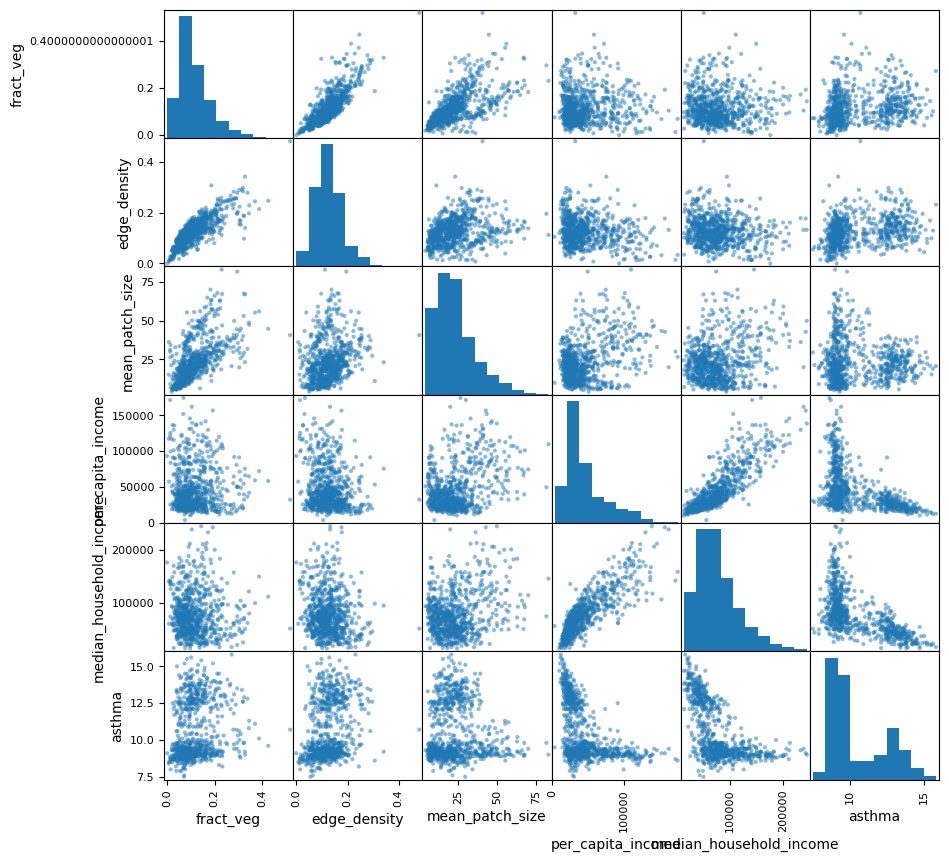

In [80]:
### Visualize distribution of data

# graph for variables
vars = ['fract_veg', 'edge_density', 'mean_patch_size', 
        'per_capita_income','median_household_income','asthma']

# scatter plot matrix
pd.plotting.scatter_matrix(
    ndvi_inc_gdf[vars],
    figsize = (10, 10)
)

In [103]:
# drop missing data

model_gdf = (
    ndvi_inc_gdf
    
    #make a copy to avoid modifying original data
    .copy()

    # subset to columns
    [['tractID','fract_veg', 'edge_density', 'mean_patch_size', 
        'per_capita_income','median_household_income','asthma', 'geometry']]

    # drop NA
    .dropna()
)

model_gdf

,tractID,fract_veg,edge_density,mean_patch_size,per_capita_income,median_household_income,asthma,geometry
0,17031010100,0.178657,0.118612,55.225919,45353,69460.0,11.3,"POLYGON ((-9758835.381 5164429.383, -9758837.3..."
1,17031010201,0.213859,0.161668,57.543394,31978,49639.0,11.2,"POLYGON ((-9760143.496 5163888.741, -9760143.4..."
2,17031010202,0.186055,0.123673,63.260250,33488,55119.0,10.2,"POLYGON ((-9759754.212 5163883.196, -9759726.6..."
3,17031010300,0.191675,0.126384,57.113642,42487,65871.0,10.2,"POLYGON ((-9758695.229 5163870.91, -9758695.78..."
4,17031010400,0.198563,0.079474,52.983817,33185,49017.0,10.6,"POLYGON ((-9757724.634 5160715.939, -9757742.2..."
...,...,...,...,...,...,...,...,...
783,17031843500,0.075254,0.104686,9.732779,3546,55833.0,9.5,"POLYGON ((-9761322.813 5136241.389, -9761337.5..."
784,17031843600,0.054393,0.101217,9.177296,38837,71359.0,12.5,"POLYGON ((-9752318.844 5132492.145, -9752318.2..."
785,17031843700,0.027644,0.047642,7.477533,101400,134000.0,8.9,"POLYGON ((-9761412.872 5153004.52, -9761411.75..."
786,17031843800,0.093920,0.105052,24.169295,27767,57885.0,10.9,"POLYGON ((-9755524.513 5130243.96, -9755529.18..."


In [104]:
# Calculate logs
for col in ['fract_veg', 'edge_density', 'mean_patch_size', 
            'per_capita_income','median_household_income','asthma']:
    model_gdf[f'log_{col}'] = np.log(model_gdf[col])

model_gdf

,tractID,fract_veg,edge_density,mean_patch_size,per_capita_income,median_household_income,asthma,geometry,log_fract_veg,log_edge_density,log_mean_patch_size,log_per_capita_income,log_median_household_income,log_asthma
0,17031010100,0.178657,0.118612,55.225919,45353,69460.0,11.3,"POLYGON ((-9758835.381 5164429.383, -9758837.3...",-1.722286,-2.131894,4.011432,10.722232,11.148506,2.424803
1,17031010201,0.213859,0.161668,57.543394,31978,49639.0,11.2,"POLYGON ((-9760143.496 5163888.741, -9760143.4...",-1.542437,-1.822208,4.052539,10.372803,10.812532,2.415914
2,17031010202,0.186055,0.123673,63.260250,33488,55119.0,10.2,"POLYGON ((-9759754.212 5163883.196, -9759726.6...",-1.681715,-2.090110,4.147257,10.418942,10.917250,2.322388
3,17031010300,0.191675,0.126384,57.113642,42487,65871.0,10.2,"POLYGON ((-9758695.229 5163870.91, -9758695.78...",-1.651954,-2.068434,4.045043,10.656953,11.095454,2.322388
4,17031010400,0.198563,0.079474,52.983817,33185,49017.0,10.6,"POLYGON ((-9757724.634 5160715.939, -9757742.2...",-1.616649,-2.532326,3.969987,10.409853,10.799922,2.360854
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,17031843500,0.075254,0.104686,9.732779,3546,55833.0,9.5,"POLYGON ((-9761322.813 5136241.389, -9761337.5...",-2.586880,-2.256786,2.275499,8.173575,10.930120,2.251292
784,17031843600,0.054393,0.101217,9.177296,38837,71359.0,12.5,"POLYGON ((-9752318.844 5132492.145, -9752318.2...",-2.911514,-2.290487,2.216733,10.567129,11.175479,2.525729
785,17031843700,0.027644,0.047642,7.477533,101400,134000.0,8.9,"POLYGON ((-9761412.872 5153004.52, -9761411.75...",-3.588343,-3.044045,2.011903,11.526828,11.805595,2.186051
786,17031843800,0.093920,0.105052,24.169295,27767,57885.0,10.9,"POLYGON ((-9755524.513 5130243.96, -9755529.18...",-2.365307,-2.253298,3.185083,10.231604,10.966214,2.388763


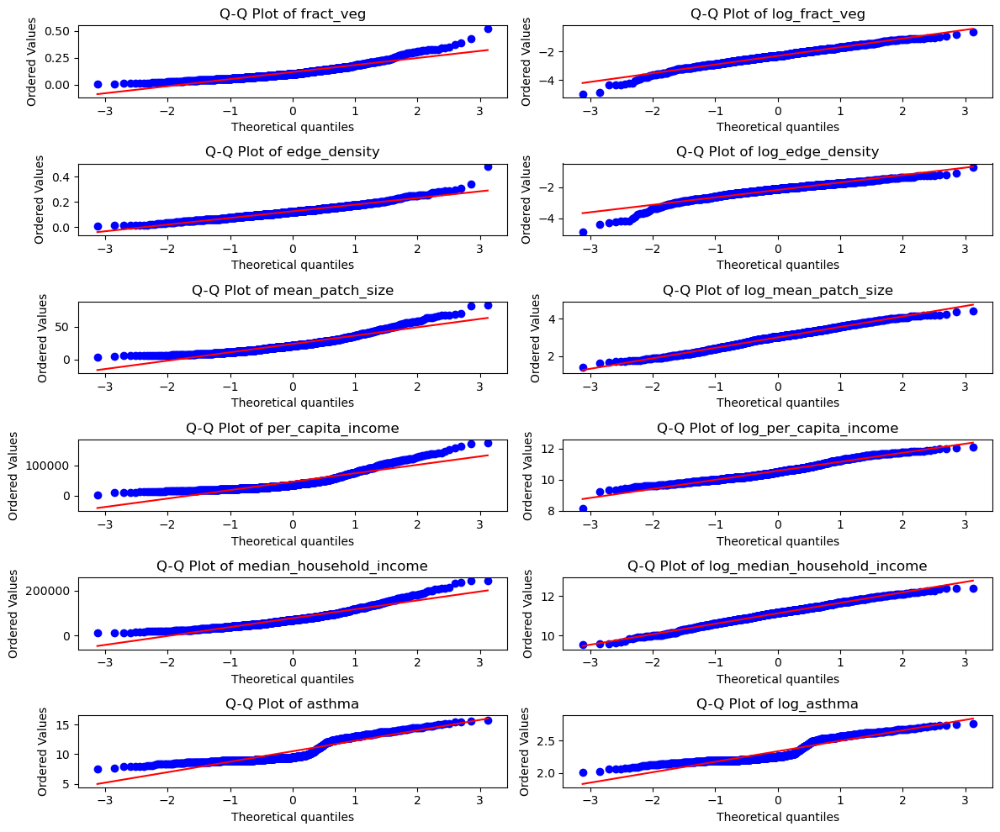

In [105]:
# q-q plots

# set variables for q-q plots
var_qq = [
    'fract_veg', 'log_fract_veg', 'edge_density', 'log_edge_density', 'mean_patch_size', 'log_mean_patch_size', 
    'per_capita_income','log_per_capita_income','median_household_income','log_median_household_income','asthma','log_asthma'
]

# make plot for each variable
plt.figure(figsize = (12,10))
for i, var in enumerate(var_qq, 1):
    
    # 2x2 facet
    plt.subplot(6, 2, i)

    # norm distribution q-q plot
    stats.probplot(model_gdf[var], dist="norm", plot=plt)

    # add title
    plt.title(f'Q-Q Plot of {var}')

plt.tight_layout()
plt.show()

From what I can tell from the histograms and q-q plots, fract_veg and edge_density as well as median_household_income and per_capita_income are correlated most closely to each other so I will pick one (or the log version) from each pair. Log_fract_veg seems to perform best of the top four options from non-exhaustive prior testing, and log_median_household_income looks most normally distributed of that grouping. I will now build a model with log_fract_veg, log_median_household_income, and log_mean_patch_size as x variables and asthma as our y variable.

In [106]:
# Set predictor and response variables for modeling
X = model_gdf[['log_fract_veg', 'log_mean_patch_size', 'log_median_household_income']]
Y = model_gdf[['log_asthma']]

# Split data into training and testing sets
X_train, X_test, Y_train, Y_test = train_test_split(
    X, Y, test_size=0.33, random_state=42
)

# Fit linear regression model
reg = LinearRegression()
reg.fit(X_train, Y_train)   

# Make predictions on the test set
Y_test['pred_asthma'] = np.exp(reg.predict(X_test))

# use the trained model to predict asthma for all tracts
model_gdf['pred_asthma'] = np.exp(reg.predict(X))

Y_test['measured_asthma'] = np.exp(Y_test['log_asthma'])

Y_test

,log_asthma,pred_asthma,measured_asthma
574,2.332144,11.898119,10.3
535,2.091864,10.189445,8.1
616,2.602690,11.847563,13.5
109,2.240710,10.113142,9.4
592,2.493205,12.858251,12.1
...,...,...,...
18,2.151762,9.718228,8.6
576,2.219203,11.059941,9.2
141,2.186051,7.897718,8.9
337,2.617396,11.558575,13.7


In [107]:
# vmin = Y_test[cols].min().min()
# vmax = Y_test[cols].max().max()

p_est = (Y_test
    .hvplot.scatter(x='measured_asthma', y='pred_asthma',
                    xlabel = 'Measured Asthma Prevalence',
                    ylabel = 'Predicted Asthma Prevalence',
                    title = 'Regression Model Distribution')
    .opts(aspect='equal', 
        #   xlim=(xylim), ylim=(xylim), 
          width=600, height=600)
) * hv.Slope(slope=1, y_intercept=0).opts(color='black')

p_est

:Overlay
   .Scatter.I    :Scatter   [measured_asthma]   (pred_asthma)
   .Annotation.I :Slope   [x,y]

In [108]:
model_gdf = gpd.GeoDataFrame(
    model_gdf,
    geometry='geometry',
    crs=ndvi_inc_gdf.crs  # use the original CRS
)

In [109]:
model_gdf

,tractID,fract_veg,edge_density,mean_patch_size,per_capita_income,median_household_income,asthma,geometry,log_fract_veg,log_edge_density,log_mean_patch_size,log_per_capita_income,log_median_household_income,log_asthma,pred_asthma
0,17031010100,0.178657,0.118612,55.225919,45353,69460.0,11.3,"POLYGON ((-9758835.381 5164429.383, -9758837.3...",-1.722286,-2.131894,4.011432,10.722232,11.148506,2.424803,10.519589
1,17031010201,0.213859,0.161668,57.543394,31978,49639.0,11.2,"POLYGON ((-9760143.496 5163888.741, -9760143.4...",-1.542437,-1.822208,4.052539,10.372803,10.812532,2.415914,11.441303
2,17031010202,0.186055,0.123673,63.260250,33488,55119.0,10.2,"POLYGON ((-9759754.212 5163883.196, -9759726.6...",-1.681715,-2.090110,4.147257,10.418942,10.917250,2.322388,11.061450
3,17031010300,0.191675,0.126384,57.113642,42487,65871.0,10.2,"POLYGON ((-9758695.229 5163870.91, -9758695.78...",-1.651954,-2.068434,4.045043,10.656953,11.095454,2.322388,10.686823
4,17031010400,0.198563,0.079474,52.983817,33185,49017.0,10.6,"POLYGON ((-9757724.634 5160715.939, -9757742.2...",-1.616649,-2.532326,3.969987,10.409853,10.799922,2.360854,11.427801
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
783,17031843500,0.075254,0.104686,9.732779,3546,55833.0,9.5,"POLYGON ((-9761322.813 5136241.389, -9761337.5...",-2.586880,-2.256786,2.275499,8.173575,10.930120,2.251292,10.668535
784,17031843600,0.054393,0.101217,9.177296,38837,71359.0,12.5,"POLYGON ((-9752318.844 5132492.145, -9752318.2...",-2.911514,-2.290487,2.216733,10.567129,11.175479,2.525729,9.903013
785,17031843700,0.027644,0.047642,7.477533,101400,134000.0,8.9,"POLYGON ((-9761412.872 5153004.52, -9761411.75...",-3.588343,-3.044045,2.011903,11.526828,11.805595,2.186051,8.277265
786,17031843800,0.093920,0.105052,24.169295,27767,57885.0,10.9,"POLYGON ((-9755524.513 5130243.96, -9755529.18...",-2.365307,-2.253298,3.185083,10.231604,10.966214,2.388763,10.595762


In [148]:
# Calculate error 
model_gdf['error_asthma'] = model_gdf['pred_asthma'] - model_gdf['asthma']

# Set limit
abs_max = model_gdf['error_asthma'].abs().max()
clim = (-abs_max, abs_max)


# Plot error
model_plot = (
    gv.tile_sources.EsriImagery
    *
    gv.Polygons(
        model_gdf.to_crs(ccrs.Mercator()),
        vdims=['error_asthma', 'pred_asthma', 'asthma', 'tractID'],
        crs = ccrs.Mercator()    
    ).opts(color = 'error_asthma', colorbar = True, tools = ['hover'],
           clim = clim, cmap = 'RdBu'  # Diverging color map)
).opts(width = 600, height = 600, xaxis = None, yaxis = None, title = 'Asthma Prediction Error',
       clabel = 'Lower values indicate under-prediction, higher values indicate over-prediction')
)
model_plot


:Overlay
   .WMTS.I     :WMTS   [Longitude,Latitude]
   .Polygons.I :Polygons   [Longitude,Latitude]   (error_asthma,pred_asthma,asthma,tractID)

In [149]:
hv.save(model_plot, 'asthma_error_map.html', fmt='html')


## R<sup>2</sup> Calculation

In [129]:
y_true = model_gdf['asthma'].values       # observed
y_pred = model_gdf['pred_asthma'].values  # predicted

In [130]:
# Example if you know which rows were training/testing
train_mask = model_gdf.index.isin(X_train.index)
test_mask  = model_gdf.index.isin(X_test.index)

r2_train = r2_score(y_true[train_mask], y_pred[train_mask])
r2_test  = r2_score(y_true[test_mask], y_pred[test_mask])

print(f"Training R²: {r2_train:.3f}")
print(f"Test R²: {r2_test:.3f}")


Training R²: 0.522
Test R²: 0.584


In [131]:
r2 = r2_score(y_true, y_pred)
print(f"R² (all): {r2:.3f}")


R² (all): 0.546


In [132]:
# Example if you know which rows were training/testing
train_mask = model_gdf.index.isin(X_train.index)
test_mask  = model_gdf.index.isin(X_test.index)

r2_train = r2_score(y_true[train_mask], y_pred[train_mask])
r2_test  = r2_score(y_true[test_mask], y_pred[test_mask])

print(f"Training R²: {r2_train:.3f}")
print(f"Test R²: {r2_test:.3f}")


Training R²: 0.522
Test R²: 0.584
